### Rock Classification Model
##### I attempted using the "flow from directory" model of tensorflow to train a machine learning alogorithm that classifies
##### rocks as either foliated, non-foliated, or sedimentary. This assumes that both igneous and metamorphic rocks can be 
##### non-foliated basement rocks. Rocks like quartzite, ryholite, and other very fine grained basement rocks are not fully
##### accounted for. This may introduce some level of error into the model. But generally, the aim is to identify rock units
##### with obvious textural differences.

##### I've just used a method of one branch of machine learning (computer vision) to achieve this and am very enthusiatic about
##### the endless potential that machine learning offers to geoscience.

In [6]:
# import necessary libraries
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from tensorflow.keras.optimizers import RMSprop
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import cv2
import os

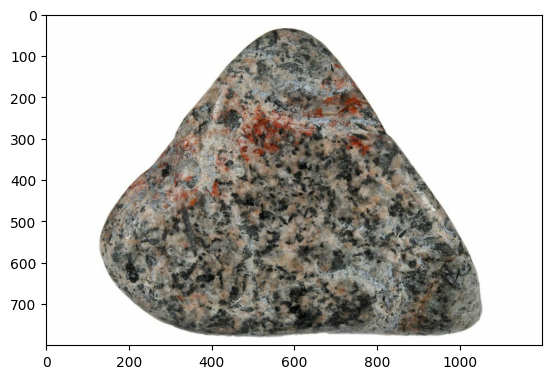

In [7]:
# Verify image
img_path = image.load_img(r".\datasets\Train\Nonfoliated basement\ign_3.jpeg")
plt.imshow(img_path)

In [8]:
cv2.imread(r".\datasets\Train\Nonfoliated basement\ign_3.jpeg").shape  # check image shape

(800, 1200, 3)

In [9]:
train = ImageDataGenerator(rescale= 1/255)
validation= ImageDataGenerator(rescale= 1/255)

In [10]:
# Convert input training data into datasets that can be fed into neural network (NN)
train_data= train.flow_from_directory(r'datasets\Train\\', target_size= (200,200), 
                                      batch_size = 5, class_mode='categorical')
train_data.class_indices # Show assigned classes to be used by the model

Found 165 images belonging to 3 classes.


{'Foliated basement': 0, 'Nonfoliated basement': 1, 'Sedimentary': 2}

In [11]:
valid_data= validation.flow_from_directory(r'datasets\validation\\', target_size= (200,200), 
                                      batch_size = 5, class_mode='categorical')
valid_data.class_indices

Found 65 images belonging to 3 classes.


{'Foliated basement': 0, 'Nonfoliated basement': 1, 'Sedimentary': 2}

In [12]:
# Preview labels
print('The training labels are: ', train_data.classes)
print('The validation labels are: ', valid_data.classes)

The training labels are:  [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2]
The validation labels are:  [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2]


##### The Model

In [13]:
model = tf.keras.models.Sequential([tf.keras.layers.Conv2D(16,(3,3),activation= 'relu', input_shape= (200, 200, 3)),
                                    tf.keras.layers.MaxPool2D(2,2),
                                    #
                                    tf.keras.layers.Conv2D(32,(3,3),activation= 'relu'),
                                    tf.keras.layers.MaxPool2D(2,2),
                                    #
                                    tf.keras.layers.Conv2D(64,(3,3),activation= 'relu'),
                                    tf.keras.layers.MaxPool2D(2,2),
                                    #
                                    tf.keras.layers.Flatten(),
                                    #
                                    tf.keras.layers.Dense(512, activation= 'relu'),
                                    tf.keras.layers.Dense(3, activation= 'softmax')
                                    ])

C:\Users\Ddr3\Documents\Projects\CV\cvision\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [14]:
# Compile the model
model.compile(loss= tf.keras.losses.categorical_crossentropy, optimizer= RMSprop(learning_rate=1e-3),
              metrics= ['accuracy'])

In [15]:
# Fit/train the model
fitted_model= model.fit(train_data, steps_per_epoch= 10,
                        epochs= 100, validation_data= valid_data)

Epoch 1/100


C:\Users\Ddr3\Documents\Projects\CV\cvision\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 10s 688ms/step - accuracy: 0.4143 - loss: 4.7675 - val_accuracy: 0.3077 - val_loss: 1.1146
Epoch 2/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 480ms/step - accuracy: 0.4212 - loss: 1.1313 - val_accuracy: 0.3077 - val_loss: 1.0888
Epoch 3/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 489ms/step - accuracy: 0.3920 - loss: 1.0648 - val_accuracy: 0.3077 - val_loss: 1.1539
Epoch 4/100
 3/10 ━━━━━━━━━━━━━━━━━━━━ 2s 378ms/step - accuracy: 0.3444 - loss: 1.0832

C:\Users\Ddr3\anaconda3\Lib\contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(value)


10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 180ms/step - accuracy: 0.3367 - loss: 1.0818 - val_accuracy: 0.5231 - val_loss: 1.0504
Epoch 5/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 6s 465ms/step - accuracy: 0.5604 - loss: 1.0733 - val_accuracy: 0.5231 - val_loss: 1.0538
Epoch 6/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 471ms/step - accuracy: 0.5799 - loss: 0.9810 - val_accuracy: 0.5231 - val_loss: 1.0491
Epoch 7/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 433ms/step - accuracy: 0.5007 - loss: 1.0868 - val_accuracy: 0.4769 - val_loss: 1.0949
Epoch 8/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 167ms/step - accuracy: 0.6333 - loss: 0.9128 - val_accuracy: 0.3846 - val_loss: 1.1141
Epoch 9/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 440ms/step - accuracy: 0.4131 - loss: 1.1946 - val_accuracy: 0.4615 - val_loss: 1.0584
Epoch 10/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 447ms/step - accuracy: 0.7086 - loss: 0.9724 - val_accuracy: 0.3385 - val_loss: 1.9266
Epoch 11/100
10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 451ms/step - accuracy: 0.3953 - loss: 1.1395 - val_accuracy: 0.32

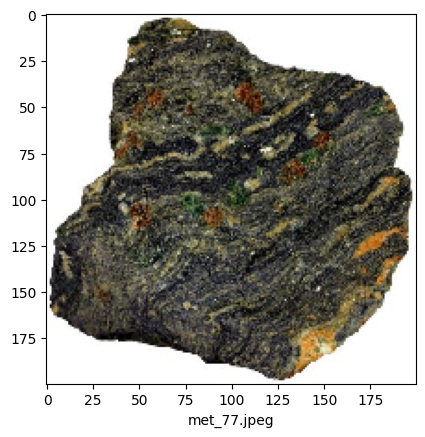

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
[1. 0. 0.]
This is most likely a foliated basement rock


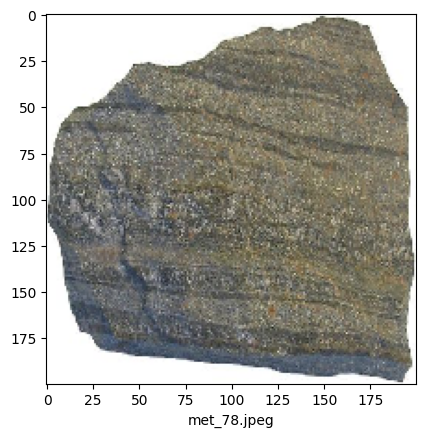

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
[1. 0. 0.]
This is most likely a foliated basement rock


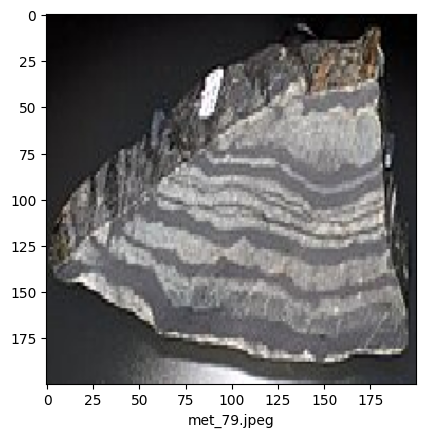

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
[0. 0. 1.]
This is most likely a sedimentary rock


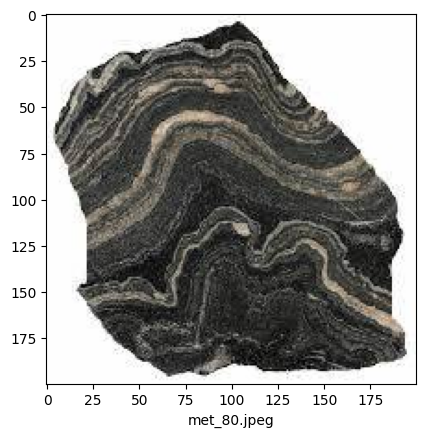

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
[0. 1. 0.]
This is most likely a nonfoliated basement rock


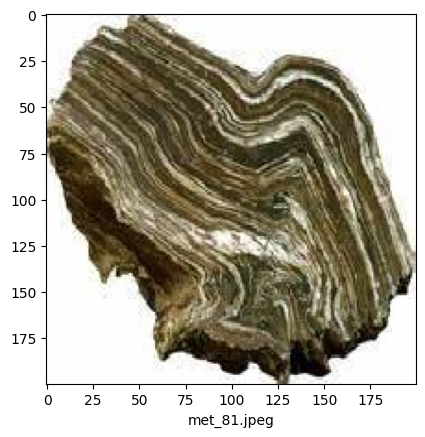

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
[1. 0. 0.]
This is most likely a foliated basement rock


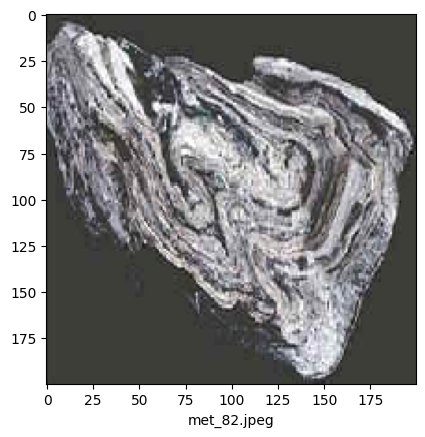

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
[1. 0. 0.]
This is most likely a foliated basement rock


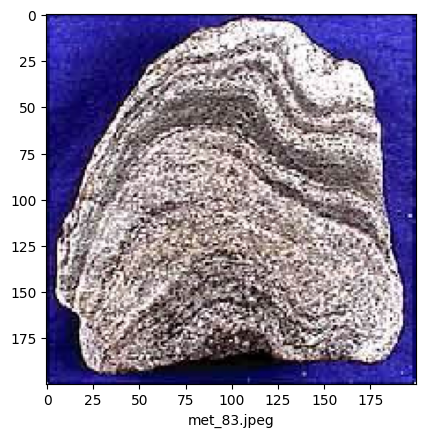

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
[0. 0. 1.]
This is most likely a sedimentary rock


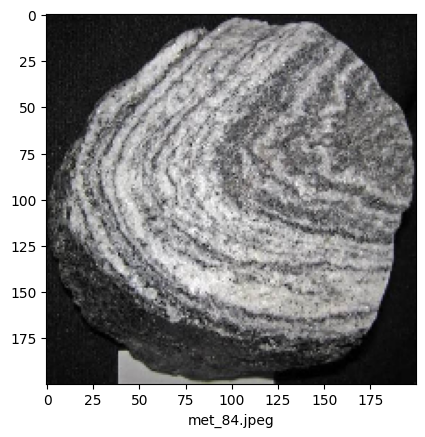

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
[0. 1. 0.]
This is most likely a nonfoliated basement rock


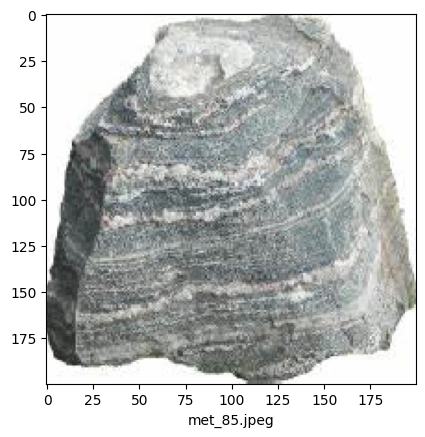

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
[0. 0. 1.]
This is most likely a sedimentary rock


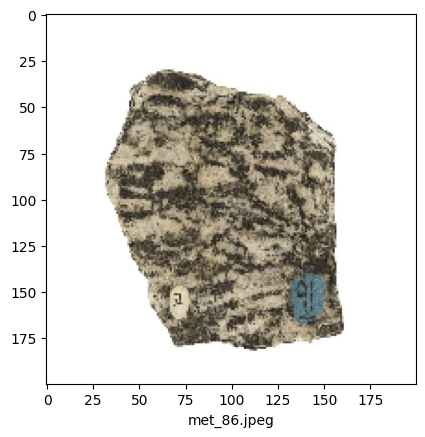

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
[0. 1. 0.]
This is most likely a nonfoliated basement rock


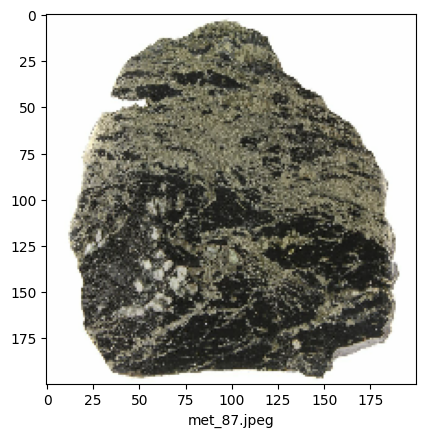

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
[1. 0. 0.]
This is most likely a foliated basement rock


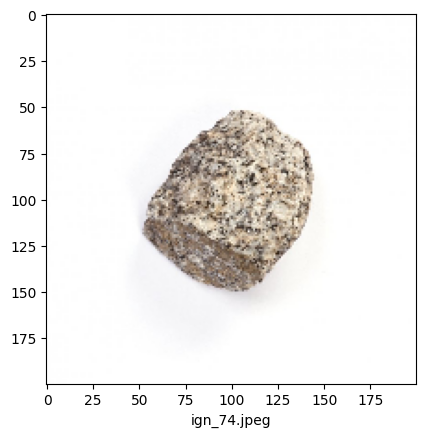

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
[0. 0. 1.]
This is most likely a sedimentary rock


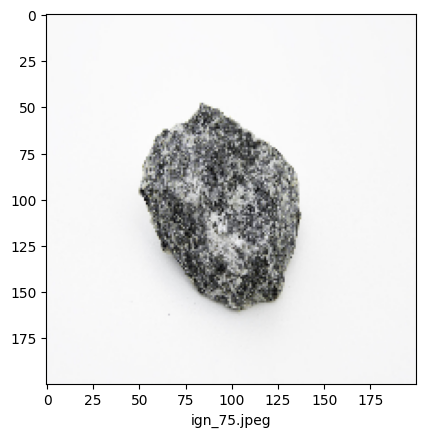

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
[0. 1. 0.]
This is most likely a nonfoliated basement rock


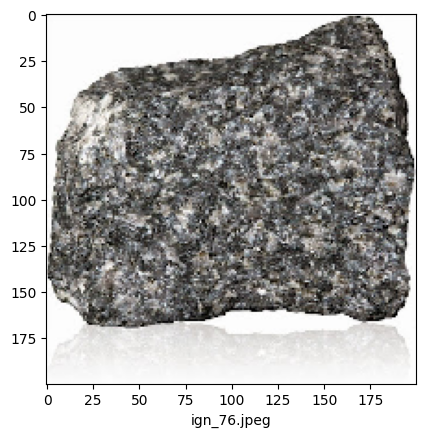

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
[1.3054444e-10 1.0000000e+00 0.0000000e+00]
This is most likely a nonfoliated basement rock


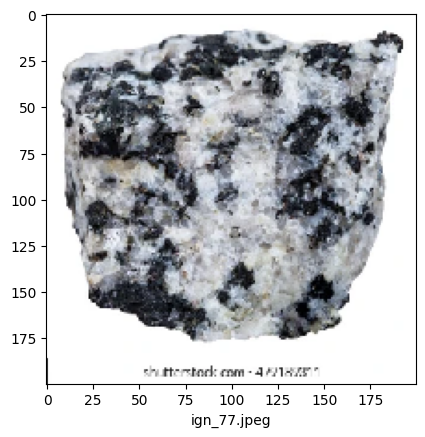

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
[1. 0. 0.]
This is most likely a foliated basement rock


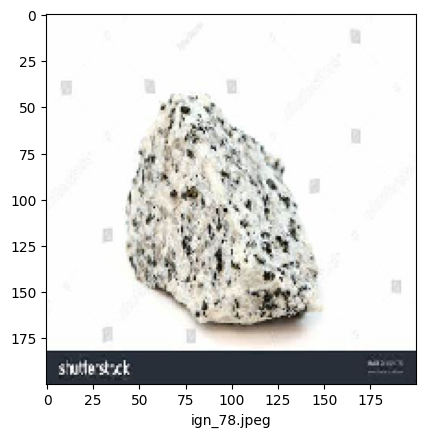

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
[0. 1. 0.]
This is most likely a nonfoliated basement rock


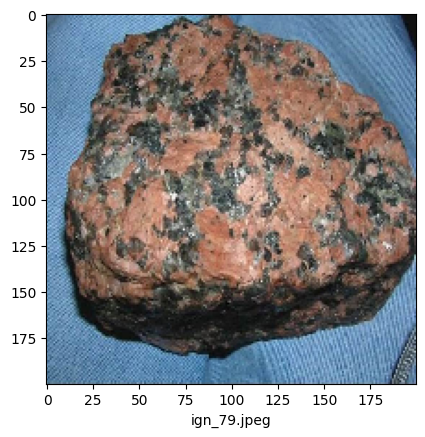

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
[0. 0. 1.]
This is most likely a sedimentary rock


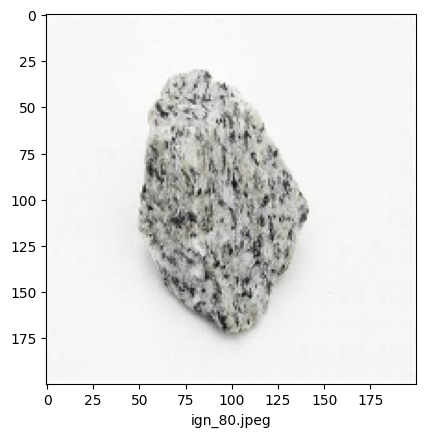

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
[0. 1. 0.]
This is most likely a nonfoliated basement rock


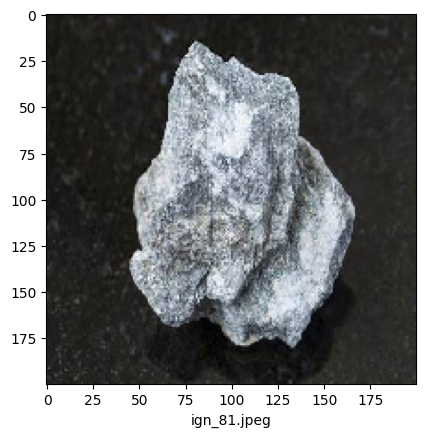

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
[1. 0. 0.]
This is most likely a foliated basement rock


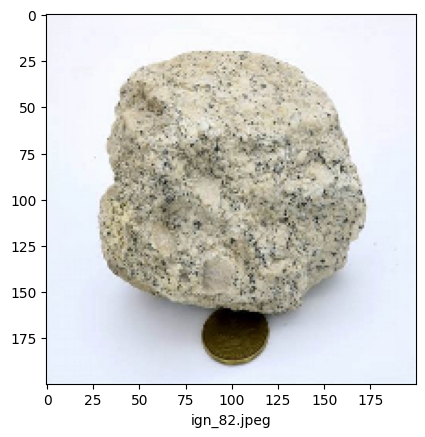

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
[0. 0. 1.]
This is most likely a sedimentary rock


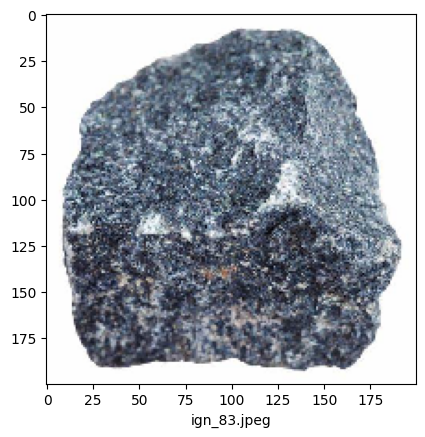

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
[0. 1. 0.]
This is most likely a nonfoliated basement rock


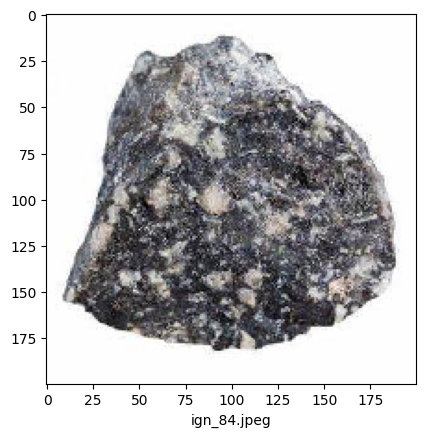

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
[0. 1. 0.]
This is most likely a nonfoliated basement rock


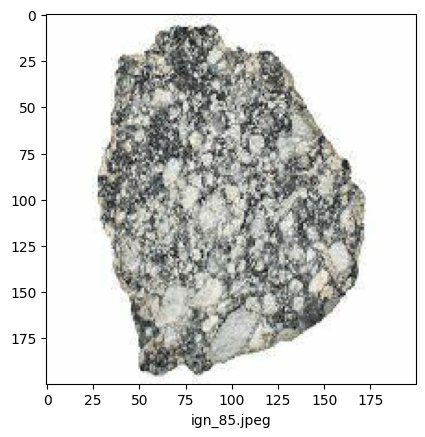

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
[1. 0. 0.]
This is most likely a foliated basement rock


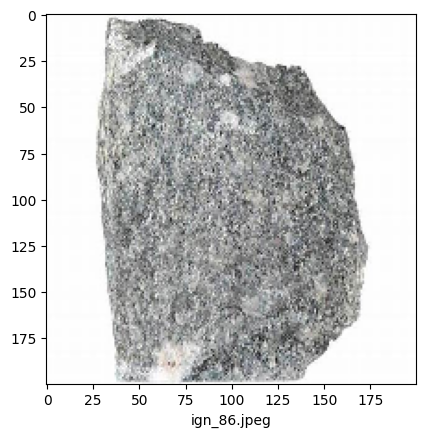

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
[8.149056e-26 1.000000e+00 0.000000e+00]
This is most likely a nonfoliated basement rock


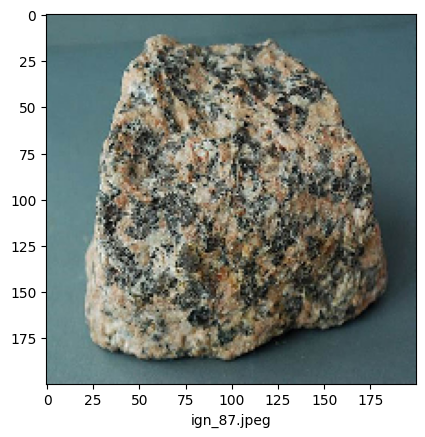

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
[0. 1. 0.]
This is most likely a nonfoliated basement rock


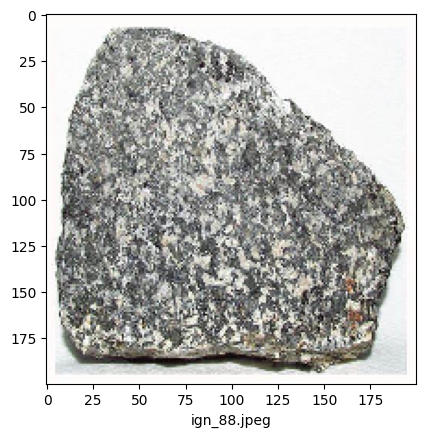

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
[0. 1. 0.]
This is most likely a nonfoliated basement rock


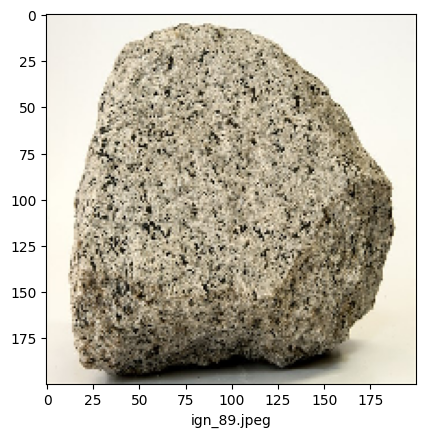

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
[1. 0. 0.]
This is most likely a foliated basement rock


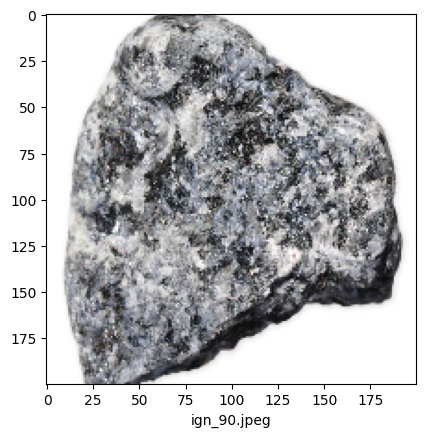

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
[1.00000e+00 5.91279e-32 0.00000e+00]
This is most likely a foliated basement rock


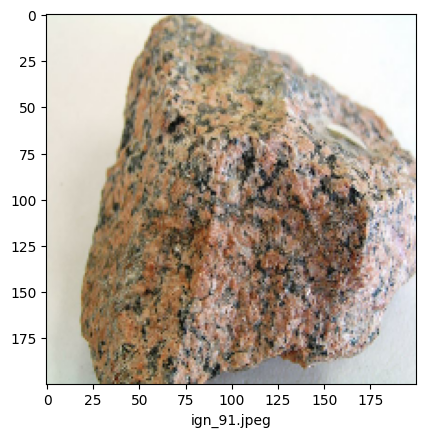

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
[0. 1. 0.]
This is most likely a nonfoliated basement rock


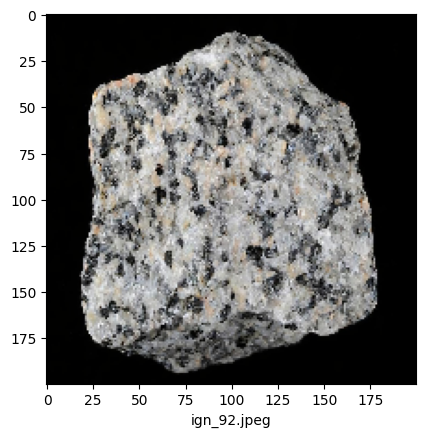

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
[1. 0. 0.]
This is most likely a foliated basement rock


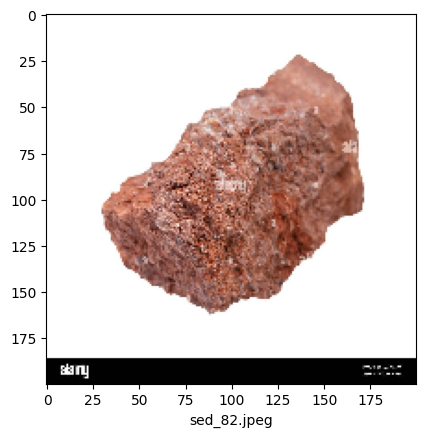

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
[0. 0. 1.]
This is most likely a sedimentary rock


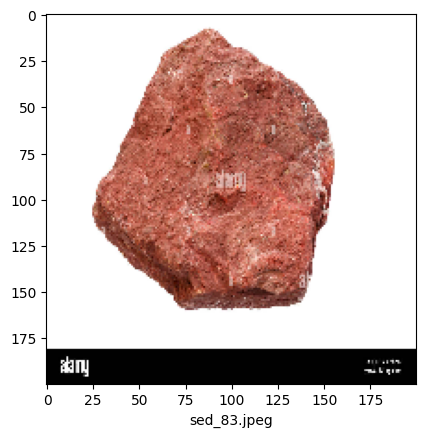

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
[0. 1. 0.]
This is most likely a nonfoliated basement rock


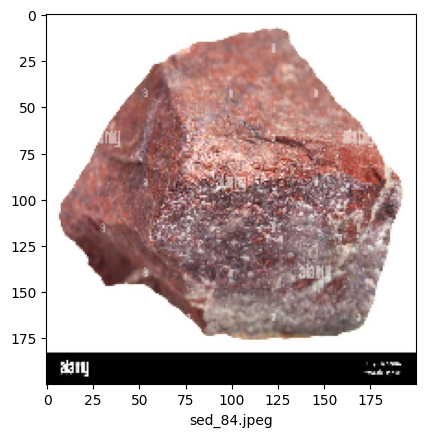

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
[0.0000000e+00 1.0000000e+00 2.2067687e-26]
This is most likely a nonfoliated basement rock


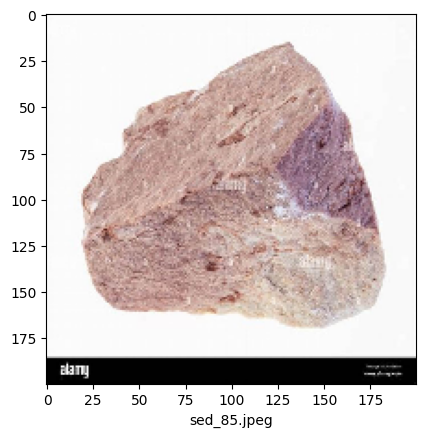

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
[0. 0. 1.]
This is most likely a sedimentary rock


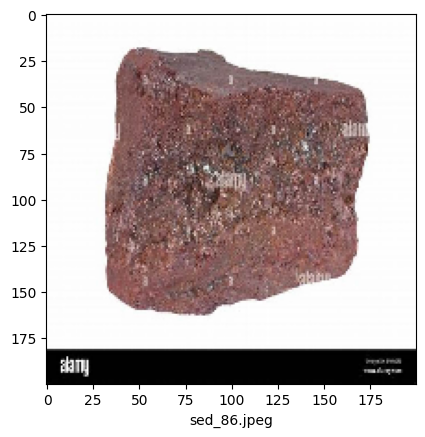

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
[0. 1. 0.]
This is most likely a nonfoliated basement rock


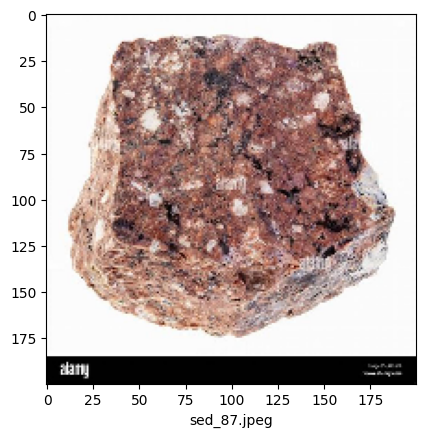

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
[0. 0. 1.]
This is most likely a sedimentary rock


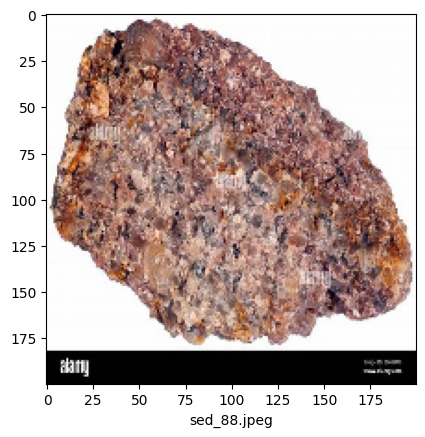

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
[0. 1. 0.]
This is most likely a nonfoliated basement rock


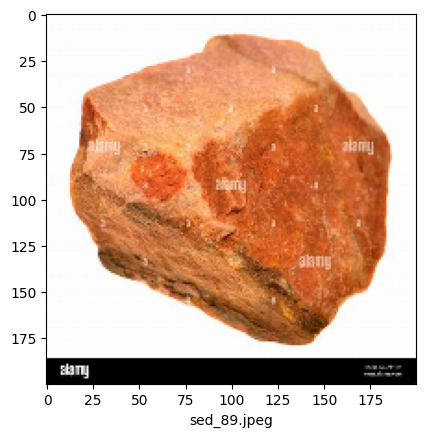

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
[0. 0. 1.]
This is most likely a sedimentary rock


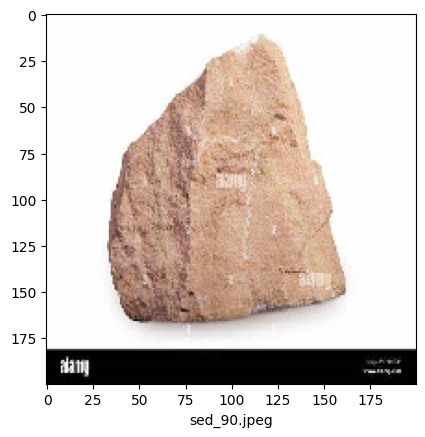

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
[0. 0. 1.]
This is most likely a sedimentary rock


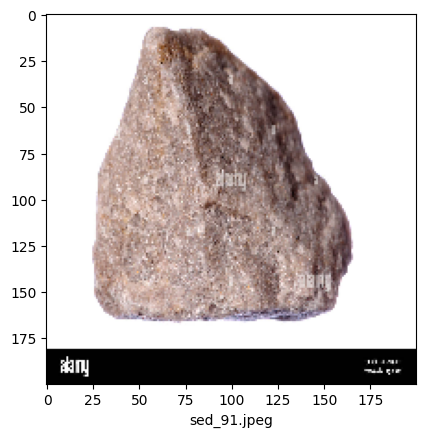

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
[0. 1. 0.]
This is most likely a nonfoliated basement rock


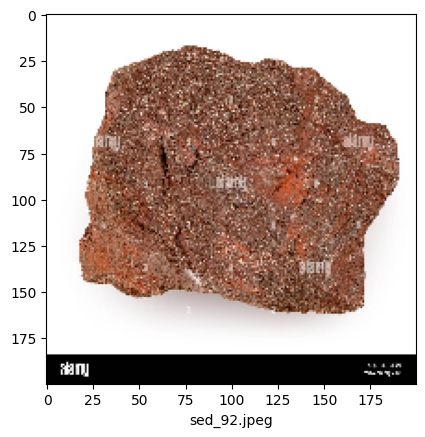

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
[0. 0. 1.]
This is most likely a sedimentary rock


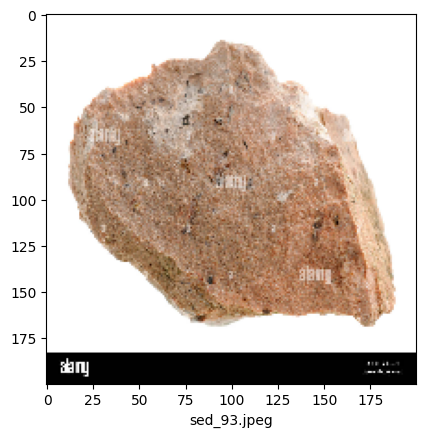

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
[0. 0. 1.]
This is most likely a sedimentary rock


In [37]:
imgspath= 'datasets\\Test\\'
for i in  os.listdir(imgspath):
    fold_paths= os.path.join(imgspath, i)
    for each in os.listdir(fold_paths):
        img= image.load_img(os.path.join(fold_paths,each), target_size=(200,200,3))
        plt.imshow(img)
        plt.xlabel(each) # Used to compare the actual label vs predicted
        plt.show()

        x= image.img_to_array(img)
        x= np.expand_dims(x, axis= 0)
        images= np.vstack([x])
        predicted= model.predict(images)
        print(predicted[0])
        if predicted[0][0]== 1:
            print('This is most likely a foliated basement rock')
        elif predicted[0][1]== 1:
            print('This is most likely a nonfoliated basement rock')
        elif predicted[0][2]== 1:
            print('This is most likely a sedimentary rock')
        

### Predict your rock sample images :)

In [42]:
def predict_rock(path):
    # path= r".\datasets\test\Nonfoliated basement\ign_80.jpeg"
    imag= image.load_img(path, target_size=(200, 200 ,3))
    plt.imshow(imag)
    plt.show()
    r= image.img_to_array(imag)
    r= np.expand_dims(r, axis= 0)
    it= np.vstack([r])
    pred= model.predict(it)
    print(pred[0])
    if pred[0][0]== 1:
        print('This is most likely a foliated basement rock')
    elif pred[0][1]== 1:
        print('This is most likely a nonfoliated basement rock')
    elif pred[0][2]== 1:
        print('This is most likely a sedimentary rock')

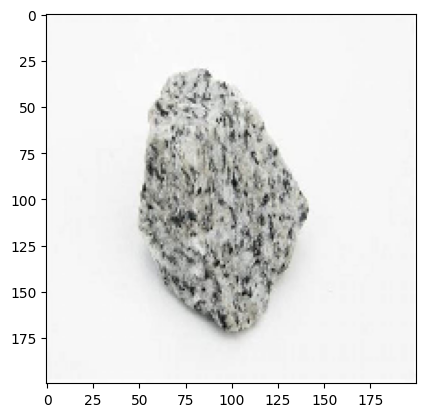

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
[0. 1. 0.]
This is most likely a nonfoliated basement rock


In [43]:
# I've predicted another random sample
predict_rock(r".\datasets\test\Nonfoliated basement\ign_80.jpeg")

### Summary
##### The model readily recognizes most of the rock types accurately but performs poorly on others due to the transition boundary between sedimentary and basement rocks. Partially weathered rocks are easily classified as sedimentary and well stratified sedimentary rocks as foliated basement rocks. 

### Recommendation
##### 1. Since this model only analyses spectral features of sample surface in digital format, more physical and geochemical parameters can be assigned to dependent variables to create a highly accurate model.
##### 2. Less than 200 images were used for training all classes in this model. Classification solely by computer vision should use an enormous ammount of training data to perform optimally. 